### Importing libraries

In [1057]:
import pandas as pd
import plotly.express as px
import numpy as np
import matplotlib.pyplot as plt
import os
from mpl_toolkits import mplot3d

from plotly.offline import download_plotlyjs, init_notebook_mode
from plotly.offline import plot, iplot
import plotly.graph_objects as go

### Importing Dataset

In [1059]:
path = r'C:\Users\aminj\Documents\DataSets\Weather Conditions & Climate Change'

In [1060]:
climate = pd.read_pickle(os.path.join(path, 'Data', 'weather-data.pkl'))
climate

,id,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,BASEL_temp_mean,...,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_snow_depth,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max,DATE,MONTH
0,-1.731975,0.660514,-0.02793,0.826097,-0.001949,-1.101066,-0.265148,-0.179228,-0.902918,-0.528623,...,-1.299744,-0.806427,-0.088407,-0.024706,0.372147,-0.668215,-0.519743,-0.752237,19600101,1
1,-1.731824,0.244897,-0.02793,0.735760,-0.001949,-1.058108,1.658760,-0.179228,-0.810126,-0.582946,...,-1.262455,-1.042055,0.503361,-0.024706,-0.829285,-0.548046,-0.629054,-0.407141,19600102,1
2,-1.731673,1.076130,-0.02793,1.277781,-0.001949,-1.251420,0.155707,-0.179228,-1.065304,-0.257010,...,-0.432779,-1.136306,-0.396127,-0.024706,-1.009500,-0.067372,0.054135,-0.177078,19600103,1
3,-1.731523,-1.001953,-0.02793,1.458455,-0.001949,-0.821838,-0.445514,-0.179228,-0.114186,-0.555784,...,0.387574,-1.183432,0.669056,-0.024706,-1.039536,-0.998679,-0.164486,-0.838511,19600104,1
4,-1.731372,0.244897,-0.02793,1.729466,-0.001949,-0.746661,-0.164944,-0.179228,0.187388,-1.003946,...,1.729970,-0.794645,-0.490810,-0.024706,0.672505,-1.509396,-1.339569,-1.471186,19600105,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,1.731372,-1.833187,-0.02793,0.284075,1.037367,-0.005632,-0.004619,-0.179228,0.720943,0.747959,...,-0.003958,-0.005290,-0.005560,-0.024706,-0.018319,-0.007287,-0.000520,-0.004530,20221027,10
22946,1.731523,0.244897,-0.02793,0.103401,0.976231,-0.005632,-0.004619,-0.179228,0.187388,0.856604,...,-0.003958,-0.005290,-0.005560,-0.024706,-0.018319,-0.007287,-0.000520,-0.004530,20221028,10
22947,1.731673,-0.586336,-0.02793,0.013064,0.716402,-0.005632,-0.004619,-0.179228,0.349774,0.856604,...,-0.003958,-0.005290,-0.005560,-0.024706,-0.018319,-0.007287,-0.000520,-0.004530,20221029,10
22948,1.731824,-0.170720,-0.02793,0.374412,0.487141,-0.005632,-0.004619,-0.179228,0.280180,0.680055,...,-0.003958,-0.005290,-0.005560,-0.024706,-0.018319,-0.007287,-0.000520,-0.004530,20221030,10


In [1061]:
#Reduce to just the mean temperatures
df = climate[['DATE', 'MONTH','BASEL_temp_mean',
 'BELGRADE_temp_mean',
 'BUDAPEST_temp_mean',
 'DEBILT_temp_mean',
 'DUSSELDORF_temp_mean',
 'GDANSK_temp_mean',
 'HEATHROW_temp_mean',
 'KASSEL_temp_mean',
 'LJUBLJANA_temp_mean',
 'MAASTRICHT_temp_mean',
 'MADRID_temp_mean',
 'MUNCHENB_temp_mean',
 'OSLO_temp_mean',
 'ROMA_temp_mean',
 'SONNBLICK_temp_mean',
 'STOCKHOLM_temp_mean',
 'TOURS_temp_mean',
 'VALENTIA_temp_mean']].copy()

In [1062]:
df

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
0,19600101,1,-0.528623,-1.016876,-1.099163,-0.114356,-0.105836,-0.927601,-0.106469,-0.182904,-1.370824,-0.097084,-0.988280,-0.265742,-0.186575,-1.280450,-0.124331,-0.391072,-0.257321,-0.668215
1,19600102,1,-0.582946,-1.107669,-1.110927,-0.367511,-0.370915,-0.825294,-0.892676,-0.212437,-1.043881,-0.232112,-0.691740,-0.353714,-0.368598,-0.539569,-0.650834,-0.415953,-0.335759,-0.548046
2,19600103,1,-0.257010,-1.084971,-1.063873,-0.509912,-0.532908,-0.940389,-0.490837,-0.389635,-0.741156,-0.487164,-0.853490,-0.403983,-0.550620,-0.876333,-0.650834,-0.615003,-0.210258,-0.067372
3,19600104,1,-0.555784,-1.209812,-1.146217,-0.525734,-0.577088,-1.042696,-0.316124,-0.493001,-0.910682,-0.472161,-0.624345,-0.642763,-0.417137,-0.775304,-0.943336,-0.764290,-0.069069,-0.998679
4,19600105,1,-1.003946,-1.209812,-1.087400,-0.320045,-0.444548,-0.978754,-0.403481,-0.552067,-0.862246,-0.307127,-0.381721,-0.906678,-0.332193,-0.926848,-0.621584,-0.503037,-0.037694,-1.509396
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,20221027,10,0.747959,0.628750,-0.005167,0.898267,1.042841,0.440753,0.906865,-0.005705,0.481853,1.268193,0.683127,0.664244,0.395898,-0.000746,0.826301,0.517090,1.295755,-0.007287
22946,20221028,10,0.856604,0.367720,-0.005167,0.945734,1.278467,0.466330,0.802037,-0.005705,0.263891,1.313202,0.561815,0.890456,0.541516,-0.000746,1.074927,0.641496,1.358505,-0.007287
22947,20221029,10,0.856604,0.083991,-0.005167,0.914089,1.101748,0.786039,0.924336,-0.005705,0.300218,1.208181,0.548336,1.053832,0.395898,-0.000746,1.221178,0.716139,1.405568,-0.007287
22948,20221030,10,0.680055,0.265577,-0.005167,0.692578,0.880848,0.376811,0.697210,-0.005705,0.397090,0.923123,0.103526,0.689378,-0.065226,-0.000746,1.235803,0.019467,0.668249,-0.007287


In [1063]:
#You'll need to reduce the dataset to only one year of data. Analyze and pick which year you want to use.

In [1064]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.
notemp = df.drop(['DATE','MONTH'], axis=1)

In [1065]:
#Look at a whisker plot of the data to see variations in temperatures
notemp.boxplot(figsize=(15,15))
plt.xticks(rotation=90)

(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18]),
 [Text(1, 0, 'BASEL_temp_mean'),
  Text(2, 0, 'BELGRADE_temp_mean'),
  Text(3, 0, 'BUDAPEST_temp_mean'),
  Text(4, 0, 'DEBILT_temp_mean'),
  Text(5, 0, 'DUSSELDORF_temp_mean'),
  Text(6, 0, 'GDANSK_temp_mean'),
  Text(7, 0, 'HEATHROW_temp_mean'),
  Text(8, 0, 'KASSEL_temp_mean'),
  Text(9, 0, 'LJUBLJANA_temp_mean'),
  Text(10, 0, 'MAASTRICHT_temp_mean'),
  Text(11, 0, 'MADRID_temp_mean'),
  Text(12, 0, 'MUNCHENB_temp_mean'),
  Text(13, 0, 'OSLO_temp_mean'),
  Text(14, 0, 'ROMA_temp_mean'),
  Text(15, 0, 'SONNBLICK_temp_mean'),
  Text(16, 0, 'STOCKHOLM_temp_mean'),
  Text(17, 0, 'TOURS_temp_mean'),
  Text(18, 0, 'VALENTIA_temp_mean')])

In [1630]:
#Reduce your dataset to a single year
dfyear = df[df['DATE'].astype(str).str.contains('1972')] #<-----INSERT YEAR HERE
dfyear

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
4383,19720101,1,-1.329882,-0.937432,-1.181507,-1.269379,-1.077794,-1.260098,-1.294515,-0.965530,-1.201298,-1.222313,-1.770068,-0.906678,-1.691297,-0.926848,-0.957961,-1.411200,-1.512331,-1.719691
4384,19720102,1,-1.384204,-1.028225,-1.122690,-1.269379,-1.254513,-1.221733,-1.399343,-1.157495,-1.201298,-1.327334,-1.594839,-1.245997,-1.642757,-0.926848,-0.972586,-1.286794,-1.449581,-1.899944
4385,19720103,1,-1.289140,-0.937432,-1.063873,-1.459245,-1.151427,-1.196156,-1.364400,-1.024596,-1.249734,-1.372344,-1.743109,-1.107756,-1.424330,-0.707951,-0.870210,-0.963339,-1.449581,-1.929986
4386,19720104,1,-1.207656,-0.880686,-1.110927,-1.380134,-1.166153,-1.055484,-1.329458,-0.995063,-1.164971,-1.252319,-1.783547,-0.906678,-1.582083,-0.977362,-1.104212,-1.013101,-1.339767,-2.741124
4387,19720105,1,-1.289140,-0.926083,-1.169744,-1.142801,-1.048340,-1.017119,-1.224630,-1.201794,-1.140753,-1.057280,-1.567881,-1.296267,-1.193768,-1.280450,-1.513715,-1.087745,-1.543707,-2.530829
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4744,19721227,12,-2.022495,-1.380049,-1.369721,-1.095334,-1.195607,-1.362405,-0.455894,-1.807222,-1.455587,-0.622191,-1.001760,-1.698423,-0.647699,-1.229935,-0.606959,-0.590121,-0.414197,-0.518004
4745,19721228,12,-1.778043,-1.811316,-1.628516,-1.079512,-0.827441,-1.528654,-0.316124,-1.526658,-1.588786,-0.667200,-1.230904,-1.447075,-0.720508,-1.364641,-0.767835,-0.565240,-0.445572,-0.848468
4746,19721229,12,-1.859527,-1.822666,-1.769677,-1.585823,-1.519592,-1.579807,-0.613136,-1.748156,-1.758312,-1.492368,-1.352216,-1.535047,-0.587025,-1.229935,-1.557590,-0.602562,-1.120141,-1.839859
4747,19721230,12,-2.008914,-1.697825,-1.663807,-2.187068,-1.696312,-1.784421,-1.574056,-1.866288,-1.855184,-1.957463,-1.176988,-1.597884,-0.320058,-0.792142,-1.542965,-0.801611,-1.559394,-1.569480


In [1631]:
dfyear.describe()

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
count,3.660000e+02,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000
mean,1.972067e+07,6.513661,-0.183578,-0.073719,-0.039428,-0.184648,-0.132634,-0.066903,-0.140743,-0.050328,-0.128857,-0.162999,-0.229769,-0.221379,-0.023384,-0.062486,-0.076779,0.036326,-0.163067,-0.213889
std,3.457653e+02,3.455958,0.897911,0.920646,0.938912,0.892864,0.875119,1.031223,0.837244,0.985919,0.922598,0.847779,0.889778,0.935480,0.943721,0.927186,0.776851,0.934371,0.832238,1.011850
min,1.972010e+07,1.000000,-2.389173,-2.583058,-2.404901,-2.883246,-2.712449,-3.127198,-2.692217,-2.693214,-2.339544,-2.752624,-1.783547,-2.263955,-2.079612,-1.937140,-1.952467,-2.157634,-2.469277,-2.741124
25%,1.972040e+07,4.000000,-0.824002,-0.767195,-0.766847,-0.822401,-0.746444,-0.783732,-0.770377,-0.684966,-0.777483,-0.712209,-0.961322,-0.894111,-0.766014,-0.724789,-0.603302,-0.702087,-0.727950,-1.028721
50%,1.972070e+07,7.000000,-0.182316,-0.012477,-0.028693,-0.130178,-0.164743,-0.096358,-0.062791,-0.094304,-0.117542,-0.157097,-0.388461,-0.253175,-0.077361,-0.236481,-0.124331,-0.117379,-0.163195,-0.187540
75%,1.972098e+07,9.750000,0.486531,0.694008,0.653584,0.486889,0.527409,0.770053,0.417669,0.703088,0.612025,0.443025,0.582034,0.475733,0.756910,0.735926,0.467986,0.772122,0.429013,0.533472
max,1.972123e+07,12.000000,1.834411,1.706919,1.865214,2.417201,2.368238,2.026509,1.762957,2.430772,1.886498,2.108364,1.640142,1.920981,2.021968,2.188221,2.113309,2.047281,1.970323,3.057013


In [1632]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.
notempyear = dfyear.drop(['DATE','MONTH'], axis=1)

In [1633]:
#Plot ALL weather data for all stations for a year 

#X = weather station
#Y = day of the year
#Z = temperature

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(z=notempyear.values)])
fig.update_layout(title='Temperatures over time', autosize=False,
                  width=600, height=600)
fig.show()

In [1634]:
#We need to make an index for the year. Create a set of data from 1 to 365 (or to 366 if it's a leap year!)
#We'll scale this by 100 as the index is made. This will help teh gradient descent converge 366 = 3.66

i = np.arange(0.01,3.67,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
361,3.62
362,3.63
363,3.64
364,3.65


In [1635]:
n_rows = dfyear.shape[0]
n_rows

366

In [1636]:
dfyear.shape

(366, 20)

In [1637]:
dfyear.isna().sum()

DATE                    0
MONTH                   0
BASEL_temp_mean         0
BELGRADE_temp_mean      0
BUDAPEST_temp_mean      0
DEBILT_temp_mean        0
DUSSELDORF_temp_mean    0
GDANSK_temp_mean        0
HEATHROW_temp_mean      0
KASSEL_temp_mean        0
LJUBLJANA_temp_mean     0
MAASTRICHT_temp_mean    0
MADRID_temp_mean        0
MUNCHENB_temp_mean      0
OSLO_temp_mean          0
ROMA_temp_mean          0
SONNBLICK_temp_mean     0
STOCKHOLM_temp_mean     0
TOURS_temp_mean         0
VALENTIA_temp_mean      0
dtype: int64

In [1638]:
duplicates = dfyear[dfyear.duplicated()]

In [1639]:
duplicates.shape

(0, 20)

In [1640]:
dfyear

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
4383,19720101,1,-1.329882,-0.937432,-1.181507,-1.269379,-1.077794,-1.260098,-1.294515,-0.965530,-1.201298,-1.222313,-1.770068,-0.906678,-1.691297,-0.926848,-0.957961,-1.411200,-1.512331,-1.719691
4384,19720102,1,-1.384204,-1.028225,-1.122690,-1.269379,-1.254513,-1.221733,-1.399343,-1.157495,-1.201298,-1.327334,-1.594839,-1.245997,-1.642757,-0.926848,-0.972586,-1.286794,-1.449581,-1.899944
4385,19720103,1,-1.289140,-0.937432,-1.063873,-1.459245,-1.151427,-1.196156,-1.364400,-1.024596,-1.249734,-1.372344,-1.743109,-1.107756,-1.424330,-0.707951,-0.870210,-0.963339,-1.449581,-1.929986
4386,19720104,1,-1.207656,-0.880686,-1.110927,-1.380134,-1.166153,-1.055484,-1.329458,-0.995063,-1.164971,-1.252319,-1.783547,-0.906678,-1.582083,-0.977362,-1.104212,-1.013101,-1.339767,-2.741124
4387,19720105,1,-1.289140,-0.926083,-1.169744,-1.142801,-1.048340,-1.017119,-1.224630,-1.201794,-1.140753,-1.057280,-1.567881,-1.296267,-1.193768,-1.280450,-1.513715,-1.087745,-1.543707,-2.530829
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4744,19721227,12,-2.022495,-1.380049,-1.369721,-1.095334,-1.195607,-1.362405,-0.455894,-1.807222,-1.455587,-0.622191,-1.001760,-1.698423,-0.647699,-1.229935,-0.606959,-0.590121,-0.414197,-0.518004
4745,19721228,12,-1.778043,-1.811316,-1.628516,-1.079512,-0.827441,-1.528654,-0.316124,-1.526658,-1.588786,-0.667200,-1.230904,-1.447075,-0.720508,-1.364641,-0.767835,-0.565240,-0.445572,-0.848468
4746,19721229,12,-1.859527,-1.822666,-1.769677,-1.585823,-1.519592,-1.579807,-0.613136,-1.748156,-1.758312,-1.492368,-1.352216,-1.535047,-0.587025,-1.229935,-1.557590,-0.602562,-1.120141,-1.839859
4747,19721230,12,-2.008914,-1.697825,-1.663807,-2.187068,-1.696312,-1.784421,-1.574056,-1.866288,-1.855184,-1.957463,-1.176988,-1.597884,-0.320058,-0.792142,-1.542965,-0.801611,-1.559394,-1.569480


In [1641]:
#This will translate your chosen weather data into the X and y datasets needed for the optimization function.

X=index.to_numpy().reshape(n_rows,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows,1))
X = np.concatenate((ones, X), axis=1)
y=dfyear['OSLO_temp_mean'].to_numpy().reshape(n_rows,1) #<----INSERT WEATHER STATION HERE

In [1642]:
X.shape, y.shape

((366, 2), (366, 1))

In [1643]:
#Look at one year of temperature data over time
plt.scatter(x=index['index'], y=dfyear['OSLO_temp_mean']) #<----INSERT WEATHER STATION HERE
plt.xlabel('X'); plt.ylabel('y');
plt.title('Input dataset');

In [1644]:
#what is the min temperature? (Note gradient descent is not actually finding this number)
dfyear['OSLO_temp_mean'].min()

-2.079611782790801

In [1645]:
dfyear['OSLO_temp_mean'].max()

2.021968325793007

In [1646]:
#This computes the loss function for the gradiant descent. DO NOT CHANGE!

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [1647]:
compute_cost(X,y)

array([0.44436173])

In [1648]:
#This is the gradiant descent function. DO NOT CHANGE!

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [1649]:
%%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=100 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[0],[0]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.1 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: total: 46.9 ms
Wall time: 103 ms


In [1650]:
theta

array([[-0.49570769],
       [ 0.26531466]])

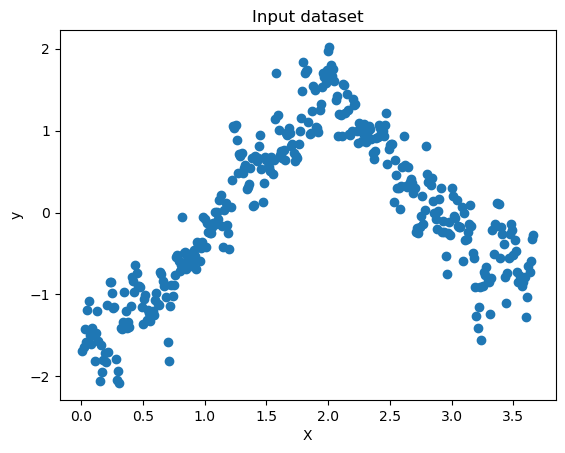

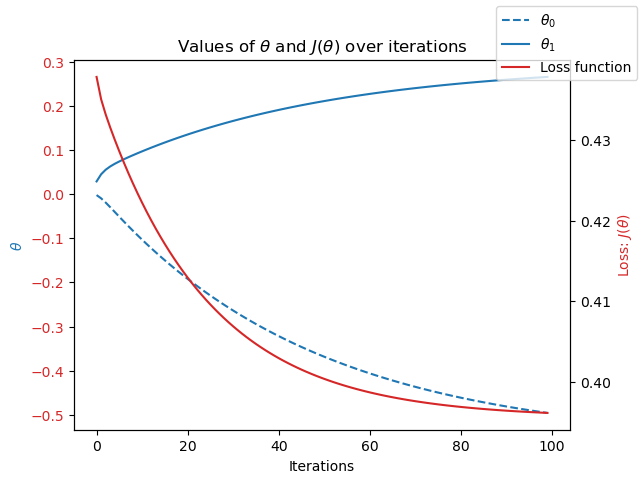

In [1651]:
#This will plot your loss, theta0, and theta1.If the result looks like a straight line, it's not converging on an answer!
#Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();
plt.show()

In [1652]:
%%time
# theta range
theta0_vals = np.linspace(0,10,300) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(0,10,300) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: total: 19.7 s
Wall time: 22.7 s


In [1653]:
#This figure shows the loss function.

#X = Theta0
#Y - Theta1
#Z = Loss
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [1654]:
#Here is the same figure as above, with the line the loss function takes toward the minimum.

#X = Theta0
#Y - Theta1
#Z = Loss
#black line = path of loss function over the iterations.
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [1655]:
#Rerun the optimization above, but this time start closer to the objective!
#Find where the black line ends near the lowest X/Y/Z coordinate and make that your guess below.

num_iterations=10 #<---start with the same iterations as above
theta_init=np.array([[1],[1]]) #<---make a guess as to a more accurate [x],[y] coordinates near the minimum in the graph above.
alpha= 0.1 #<---start with the same step size as above
theta1, J_history1, theta0_history1, theta1_history1 = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

In [1656]:
#Let's look at the new loss path on the function. It should start much closer to the goal

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history1, y=theta0_history1, z=J_history1, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history1, theta1_history1, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

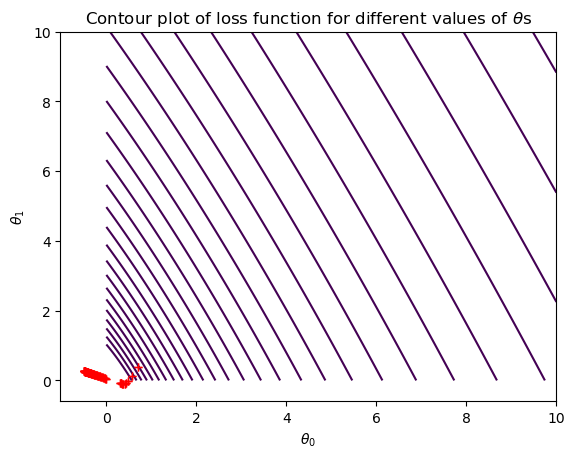

In [1657]:
#This plot shows the convergence similar to above, but only in the X/Y plane (there's no height)

plt.contour(theta0_vals, theta1_vals, J_vals, levels = np.logspace(0,10,100))
plt.xlabel('$\\theta_{0}$'); plt.ylabel("$\\theta_{1}$")
plt.title("Contour plot of loss function for different values of $\\theta$s");
plt.plot(theta0_history1, theta1_history1, 'r+');
plt.show()